# Исследование рынка заведений общественного питания Москвы

## Цель проекта:

Исследовать ресторанный бизнес Москвы для определения инвестиционно привлекательного расположения для будущего ресторана, выбора меню и оптимальных цен.

**Заказчик проекта:**

Инвесторы из фонда `«Shut Up and Take My Money»`, планирующие открыть ресторан в Москве.

**Исходные данные:**

Датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. 

**Описание данных:**

* `name` — название заведения;
* `address` — адрес заведения;
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* `hours` — информация о днях и часах работы;
* `lat` — широта географической точки, в которой находится заведение;
* `lng` — долгота географической точки, в которой находится заведение;
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽»;*


* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

* `district` — административный район, в котором находится заведение, например Центральный административный округ;
* `seats` — количество посадочных мест

## Загрузка данных и подготовка их к анализу

In [1]:
!pip3 install folium
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime, timedelta
from scipy import stats as st
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
import math as mth
import datetime as dt
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Map, Choropleth
import json

In [2]:
try:
    data = pd.read_csv('C:\datasets\moscow_places.csv', sep=',')
except:
    data = pd.read_csv('/datasets/moscow_places.csv', sep=',')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
gap = data.isna().sum().reset_index()
gap.columns = ['column','gap_amount']
gap['percent'] = round((gap['gap_amount']/len(data))*100)
gap

,column,gap_amount,percent
0,name,0,0.0
1,category,0,0.0
2,address,0,0.0
3,district,0,0.0
4,hours,536,6.0
5,lat,0,0.0
6,lng,0,0.0
7,rating,0,0.0
8,price,5091,61.0
9,avg_bill,4590,55.0


* Пропуски в значительном количестве, в следующих столбцах:
    * `hours` - 536 - 6% от имеющихся данных
    * `price` - 5091 - 61% от имеющихся данных
    * `avg_bill` - 4590 - 55% от имеющихся данных
    * `middle_avg_bill` - 5257 - 63% от имеющихся данных
    * `middle_coffee_cup` - 7871 - 94% от имеющихся данных
    
Исходя из того, что строк всего 8406, то удаление данных приведет к потере практически всех данных.

Заменим пропуски в столбце `seats` - количество посадочных мест на среднее значение по категориям.

In [6]:
for i in data['category'].unique():
    data.loc[(data['category'] == i) & (data['seats'].isna()), 'seats'] = \
    data.loc[(data['category'] == i), 'seats'].median()
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                   0
dtype: int64

In [7]:
print(data.duplicated().sum())

0


**Итого:**

* В таблице 8406 строк, 14 столбцов. 
* Дубликатов нет.

* Пропуски в значительном количестве, в следующих столбцах:
    * `hours` - 536
    * `price` - 5091
    * `avg_bill` - 4590
    * `middle_avg_bill` - 5257
    * `middle_coffee_cup` - 7871
    * `seats` - 3611

Заменили пропуски в столбце `seats` на медианное значение по категориям.
Будем иметь ввиду что имеются пропуски и внимательно рассматривать влияение пропусков на результаты исследования.

**Создадим столбец `street` с названиями улиц из столбца с адресом:**

In [8]:
pattern = '\,*,(([а-яА-Я1-9\-ё\s"]+)?(улица|переулок|шоссе|проспект|площадь|проезд|село|Проезд|аллея|бульвар|набережная|тупик|линия|)([а-яА-Яё1-9\-\s"]+)?)\,'
data['street'] = data['address'].str.extract(pat = pattern)[0]

```python
data['address'].str.split(', ').str[1]
```

**Создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):**
* логическое значение True — если заведение работает ежедневно и круглосуточно;
* логическое значение False — в противоположном случае.

In [9]:
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,60.0,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,80.0,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,55.0,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


## Анализ данных

### Рассмотрим, какие категории заведений представлены в данных, их количество:

In [10]:
category_count = data['category'].value_counts().reset_index()
category_count.columns = ['category', 'number']
category_count

,category,number
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [11]:
fig = px.bar(category_count, x='category', y='number', title='Количество объектов общественного питания по категориям')
fig.update_xaxes(tickangle=45)
fig.show()

**Больше всего в Москве кафе (2378), далее идут рестораны (2043) и кофейни (1413). Далее идут бары/пабы со отрывом почти в 2 раза от кофеен.**

### Исследуем количество посадочных мест в местах по категориям:

Рассмотрим подробнее столбец с местами `seats`.

In [12]:
seats = data['seats'].value_counts().reset_index()
seats.columns = ['seats', 'n_objects']
seats.sort_values(by='seats', ascending=False).head(15)

,seats,n_objects
86,1288.0,11
226,1200.0,1
144,1040.0,4
194,920.0,2
219,760.0,1
197,675.0,1
185,660.0,2
112,650.0,6
190,644.0,2
58,625.0,23


Удалим из данных объекты с количеством посадочных мест больше 900. Такие выбросы могут испортить показательность результата.

In [13]:
croped_data= data.query("seats<=900")
len(croped_data['seats'])

8388

In [14]:
len(data['seats']) - len(croped_data['seats'])

18

Итого удалили 18 строк.

Найдём медиану посадочных мест по категориям объектов общественного питания.

In [15]:
category_seats = croped_data.pivot_table(index='category', values='seats', aggfunc='median').sort_values(by='seats', ascending=False).reset_index()
category_seats

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [16]:
fig = px.bar(category_seats, x='category', y='seats', title='Количество посадочных мест в заведениях по категориям')
fig.update_xaxes(tickangle=45)
fig.show()

**В среднем больше всего посадочных мест в ресторанах (86), далее идёт категория "бары/пабы" с небольшим разрывом (83).
На третьем месте кафе - кофейни (80). В среднем от 50 в булочных до 86 в ресторанах**.

### Рассмотрим соотношение сетевых и несетевых заведений в датасете.

 Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [17]:
chain = data['chain'].value_counts()

In [18]:
chain = data['chain'].value_counts()
chain = chain.reset_index()
chain.columns = ['chain', 'amount']
chain['chain'] = chain['chain'].replace(0, 'несетевые')
chain['chain'] = chain['chain'].replace(1, 'сетевые')
chain

,chain,amount
0,несетевые,5201
1,сетевые,3205


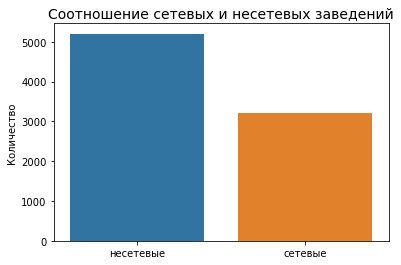

In [19]:
sns.barplot(data=chain, x='chain', y='amount')
plt.title('Соотношение сетевых и несетевых заведений', fontsize=14)
plt.xlabel('')
plt.ylabel('Количество', fontsize=10)
plt.show()

**Больше несетевых заведений, чем сетевых:**
* несетевых - 5201
* сетевых - 3205

### Выясним, какие категории заведений чаще являются сетевыми.

 Исследуйте данные и ответьте на вопрос графиком.

In [20]:
chain = data.query("chain == 1")
chain.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False


In [21]:
category_chain = chain['category'].value_counts().reset_index()
category_chain .columns = ['category', 'chain_number']
category_chain

,category,chain_number
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


In [22]:
fig = px.bar(category_chain , x='category', y='chain_number', title='Количество сетевых объектов общественного питания по категориям')
fig.update_xaxes(tickangle=45)
fig.show()

**Распределение сетевых объектов по категориям в тройке лидеров:**
* кафе - 779
* рестораны - 730
* кофейни - 720

### Найдём топ-15 популярных сетей в Москве:

In [23]:
chain.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False


In [24]:
name_chain = chain['name'].value_counts().reset_index()
name_chain.columns = ['name', 'chain_number']
top15 = name_chain.head(15)
top15

,name,chain_number
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


**На первом месте в топ 15 сеть "Шоколадница" (120), далее идут "Домино'с Пицца" (76) и "Додо Пицца" (74). На последнем месте сеть "Му-Му" (27). В тройке лидеров 2 сети - пиццерии.**

In [25]:
fig = px.bar(top15, x="name", y="chain_number", color="chain_number", title='Топ-15 сетевых объектов общественного питания')
fig.show()

### Рассмотрим, какие административные районы Москвы присутствуют в датасете.

Отобразим общее количество заведений и количество заведений каждой категории по районам на графике:

In [26]:
fig = px.histogram(croped_data, # загружаем данные
                   x='district', # указываем столбец с данными для оси X
                   color='category', # обозначаем категорию для разделения цветом
                   title='Количество заведений каждой категории по районам', # указываем заголовок
                   nbins=1000, # назначаем число корзин
                   barmode='overlay') # выбираем «полупрозрачный» тип отображения столбцов
fig.update_xaxes(title_text='Административные районы Москвы') # подпись для оси X
fig.update_yaxes(title_text='Количество заведений') # подпись для оси Y
fig.show() # выводим график

**Больше всего заведений в Центральном административном округе, что очень логично - в центральной части городов обычно располагаются точки притяжения и основные заведения. Из заведений в основном рестораны и столовые, меньше всего - пиццерий, булочных и заведений быстрого питания.**

### Рассмотрим распределение средних рейтингов по категориям заведений.

In [27]:
rating_category = croped_data.pivot_table(index='category', values='rating', aggfunc='median').reset_index()
rating_category

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
2,быстрое питание,4.2
3,кафе,4.2
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3


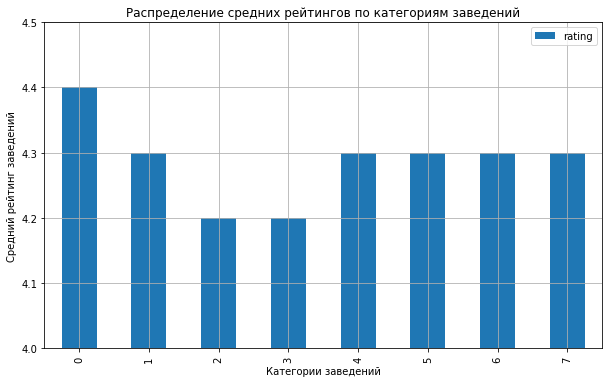

In [28]:
rating_category.plot(kind='bar', figsize = (10,6))
plt.grid()
plt.ylim([4,4.5])
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Средний рейтинг заведений')
plt.show()

In [29]:
# строим столбчатую диаграмму 
fig = px.bar(rating_category, # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='rating', # указываем столбец с данными для оси Y
             text='rating' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Категории заведений',
                   yaxis_title='Средний рейтинг')
fig.show() # выводим график

**Средние рейтинги заведений по категориям примерно одинаковые, около 4.3.**

### Построим фоновую картограмму со средним рейтингом заведений районов Москвы.

Составим сводную таблицу по районам Москвы и среднему рейтингу:

In [30]:
rating_district= croped_data.pivot_table(index='district', values='rating', aggfunc='median').reset_index()
rating_district

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [31]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name='Cредний рейтинг заведений районов Москвы',
).add_to(m)

# выводим карту
m

**Заведения с высоким средним рейтингом локализованы в Центральном административном округе. В центре заведения лучше.**

### Отобразим все заведения датасета на карте:

In [32]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
croped_data.apply(create_clusters, axis=1)

# выводим карту
m

### Найдём топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. 

In [33]:
top_streets = croped_data['street'].value_counts().reset_index()
top_streets.columns = ['street', 'count']
top_streets = pd.DataFrame(top_streets.head(15))
top_streets = top_streets.sort_values(by='count')
top_streets

,street,count
14,Пятницкая улица,48
13,улица Миклухо-Маклая,49
12,Кутузовский проспект,53
11,улица Вавилова,55
10,Люблинская улица,60
9,МКАД,65
8,Ленинградское шоссе,69
7,Варшавское шоссе,75
6,Каширское шоссе,77
5,Дмитровское шоссе,88


In [34]:
# строим столбчатую диаграмму 
fig = px.bar(top_streets, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='street', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Топ-15 улиц по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улицы')
fig.show() # выводим график


**Больше всего заведений на проспекте Мира (184). Далее идёт Профсоюзная улица (122), Ленинский проспект (107). Возможно, это потому что эти улицы самые протяжённые. Топ-15 заканчивает Пятницкая улица, она находится в самом центре, поэтому также вошла в Топ-15 по количеству заведений.**

### Найдём улицы, на которых находится только один объект общепита.

In [35]:
object_streets = croped_data['street'].value_counts().reset_index()
object_streets.columns = ['street', 'count']
one_object = object_streets.query("count==1")
one_object.columns = ['street', 'only_one']
one_object

,street,only_one
971,Сумской проезд,1
972,Анненский проезд,1
973,площадь Савёловского Вокзала,1
974,Тарутинская улица,1
975,5-я Магистральная улица,1
...,...,...
1390,Делегатская улица,1
1391,Большой Кисловский переулок,1
1392,улица Юннатов,1
1393,Путевой проезд,1


In [36]:
merged_one_obj = pd.merge(croped_data, one_object, how="right", on=["street"])
merged_one_obj.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,only_one
0,Кадастровая палата,кафе,"Москва, Сумской проезд, 2, корп. 5",Южный административный округ,NaN,55.634715,37.615380,4.2,NaN,NaN,NaN,NaN,0,60.0,Сумской проезд,NaN,1
1,Столовая в Марьиной роще,столовая,"Москва, Анненский проезд, 1, стр. 20",Северо-Восточный административный округ,пн-пт 09:00–18:00,55.802690,37.607318,4.4,средние,Средний счёт:200–300 ₽,250.0,NaN,0,75.5,Анненский проезд,False,1


In [37]:
one_obj_category = merged_one_obj.pivot_table(index='category', values='name', aggfunc='count').reset_index()
one_obj_category.columns = ['category', 'count']
one_obj_category = one_obj_category.sort_values(by='count')
one_obj_category

,category,count
1,булочная,7
5,пиццерия,15
2,быстрое питание,19
7,столовая,36
0,"бар,паб",38
4,кофейня,74
6,ресторан,91
3,кафе,144


In [38]:
fig = px.bar(one_obj_category, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение по категориям заведений, в которых только 1 заведение',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

**Визуализируем на карте распределение заведений, являющихся единственными на улице:**

In [39]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
merged_one_obj.apply(create_clusters, axis=1)

# выводим карту
m


**Всего 424 улицы в Москве, где только 1 заведение общественного питания. В основном, улицы находятся в спальных районах города, в основном, это заведения категории "кафе" (144 из 424).** 

### Посчитаем медиану средних чеков заведений, построим фоновую картограмму по полученным значениям.

In [40]:
bill_district= croped_data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
bill_district.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [41]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.5,
    legend_name='Cредний чек заведений Москвы',
).add_to(m)

# выводим карту
m

**Средний чек в диапазоне от 450 до 1000 рублей. Самый высокий средний чек в Центральном, Западном административных округах. В тройке лидеров также Северо-Западный административный округ. Дешевле всего в Юго-Восточном административном округе.**

### Проанализируем цены в Центральном административном округе.

Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [42]:
cao = croped_data.query("district=='Центральный административный округ'")
cao.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
1663,Boston seafood & bar,ресторан,"Москва, Лесная улица, 7",Центральный административный округ,"ежедневно, 12:00–00:00",55.778629,37.587275,4.9,высокие,Средний счёт:2000–2500 ₽,2250.0,NaN,1,120.0,Лесная улица,False
1680,ЧанЧан,ресторан,"Москва, Лесная улица, 1/2",Центральный административный округ,"ежедневно, 11:00–23:00",55.776796,37.585577,4.6,средние,Средний счёт:от 390 ₽,390.0,NaN,0,70.0,Лесная улица,False
1681,Лао Ли Менделеев,кофейня,"Москва, Миусская площадь, 9, стр. 11",Центральный административный округ,"ежедневно, 11:00–23:00",55.778627,37.596560,4.6,средние,Средний счёт:300–500 ₽,400.0,NaN,0,80.0,Миусская площадь,False


In [43]:
cao.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2242 entries, 1663 to 8229
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               2242 non-null   object 
 1   category           2242 non-null   object 
 2   address            2242 non-null   object 
 3   district           2242 non-null   object 
 4   hours              2211 non-null   object 
 5   lat                2242 non-null   float64
 6   lng                2242 non-null   float64
 7   rating             2242 non-null   float64
 8   price              1211 non-null   object 
 9   avg_bill           1292 non-null   object 
 10  middle_avg_bill    1060 non-null   float64
 11  middle_coffee_cup  166 non-null    float64
 12  chain              2242 non-null   int64  
 13  seats              2242 non-null   float64
 14  street             2213 non-null   object 
 15  is_24_7            2211 non-null   object 
dtypes: float64(6), int64(

**Всего в Центральном административном округе 2242 заведения.**

In [44]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['middle_avg_bill']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cao.apply(create_clusters, axis=1)

# выводим карту
m

**Чем удалённее от центра, тем меньше средний чек.**

## Детализируем исследование: открытие кофейни

In [45]:
coffee = croped_data.query("category=='кофейня'")

In [46]:
coffee.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,80.0,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,80.0,NaN,False


In [47]:
coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1410 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1410 non-null   object 
 1   category           1410 non-null   object 
 2   address            1410 non-null   object 
 3   district           1410 non-null   object 
 4   hours              1395 non-null   object 
 5   lat                1410 non-null   float64
 6   lng                1410 non-null   float64
 7   rating             1410 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1410 non-null   int64  
 13  seats              1410 non-null   float64
 14  street             1386 non-null   object 
 15  is_24_7            1395 non-null   object 
dtypes: float64(6), int64(1),

**Всего 1410 кофеен в датасете.**

In [48]:
coffee_district = coffee.pivot_table(index='district', values='category', aggfunc='count').reset_index()
coffee_district.columns = ['district', 'coffee']
coffee_district

,district,coffee
0,Восточный административный округ,104
1,Западный административный округ,148
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
4,Северо-Западный административный округ,62
5,Центральный административный округ,428
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
8,Южный административный округ,131


In [49]:
fig = px.bar(coffee_district, # загружаем данные и заново их сортируем
             x='coffee', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             text='coffee' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество кофеен по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района')
fig.show() # выводим график

**Больше всего кофеен в ЦАО - 428. Далее идет Северный АО - 193 и Северо-Восточный АО - 159.**

In [51]:
all_day_coffee = coffee.query("is_24_7==True")
all_day_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59 entries, 200 to 7923
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               59 non-null     object 
 1   category           59 non-null     object 
 2   address            59 non-null     object 
 3   district           59 non-null     object 
 4   hours              59 non-null     object 
 5   lat                59 non-null     float64
 6   lng                59 non-null     float64
 7   rating             59 non-null     float64
 8   price              25 non-null     object 
 9   avg_bill           28 non-null     object 
 10  middle_avg_bill    13 non-null     float64
 11  middle_coffee_cup  15 non-null     float64
 12  chain              59 non-null     int64  
 13  seats              59 non-null     float64
 14  street             58 non-null     object 
 15  is_24_7            59 non-null     object 
dtypes: float64(6), int64(1),

**Всего 59 круглосуточных кофеен.**

**Найдём рейтинги кофеен:**

In [ ]:
coffee_rating = coffee.pivot_table(index='district', values='rating', aggfunc='median').reset_index()
coffee_rating.sort_values(by='rating')

**Рейтинг кофеен Москвы в среднем составляет 4.3.**

**Отобразим на карте стоимость чашки кофе:**

In [ ]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
     # сохраняем URL-адрес изображения со значком торгового центра с icons8,
    # это путь к файлу на сервере icons8
    icon_url = 'https://img.icons8.com/ios/256/average-2.png'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
m

In [ ]:
coffee_cup_amount = coffee['middle_coffee_cup'].median()
coffee_cup_amount

**В среднем чашка кофе стоит 170 рублей.**

## Вывод:

* Больше всего в Москве кафе (2378), далее идут рестораны (2043) и кофейни (1413), из них сетевых - **5201**, несетевых - **3205**
* В среднем больше всего посадочных мест в ресторанах (86), далее идёт категория "бары/пабы" с небольшим разрывом (83). На третьем месте - кофейни (80). В среднем от 50 в булочных до 86 в ресторанах.
* Распределение сетевых объектов по категориям в тройке лидеров:
    *кафе - 779
    *рестораны - 730
    *кофейни - 720
* В топ 15 лидирует сеть "Шоколадница" (120), далее идут "Домино'с Пицца" (76) и "Додо Пицца" (74). На последнем месте сеть "Му-Му" (27). В тройке лидеров 2 сети - пиццерии.
* Больше всего заведений в Центральном административном округе. Из заведений в основном рестораны и столовые, меньше всего - пиццерий, булочных и заведений быстрого питания.
* Средние рейтинги заведений Москвы по категориям примерно одинаковые, около 4.3.
* В центре у заведений рейтинг выше.
* Всего 424 улицы в Москве, где только 1 заведение общественного питания. В основном, улицы находятся в спальных районах города.
* Средний чек в заведениях в диапазоне от 450 до 1000 рублей. Самый высокий средний чек в Центральном, Западном административных округах. В тройке лидеров также Северо-Западный административный округ. Дешевле всего в Юго-Восточном административном округе. Чем удалённее от центра, тем меньше средний чек.

## Рекомендации по открытию кофейни:

* Кофейню стоит открыть в Центральнов административном округе, так как в центре средний чек выше, составляет 1000 рублей.
* Стоит рассмотреть вариант открытия круглосуточной кофейни, так как их очень мало - всего 59 из 1410.
* Стоимость чашки кофе должна составлять в среднем 170 рублей, это средняя стоимость чашки кофе.